 # <h1><center>**Detectron2 Tutorial**</center></h1>




# **Assignment Part 1.   Detection from COCO dataset**
*   Installing libraries
*   Importing detectron2 from GitHub repository
*   Visualizing a pretrained model with trained image.
* Getting models from model_zoo (Official detectron2 github repository)
* Checking the predictions and detecting features in pretrained image

**Things to explore in this assignment part-1:**
1. Object Detection
2. Image Segmentation
3. Keypoints Detection
4. Panoptic Segmentation



# Watch this tutorial below for explanation of detectron stepwise <Br>
### Check official documentation for [Detectron2](https://detectron2.readthedocs.io/en/latest/tutorials/index.html) 


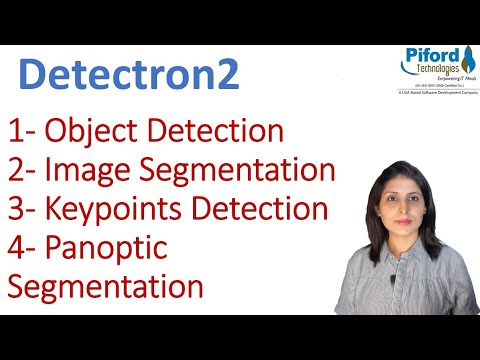

In [ ]:
from IPython.display import YouTubeVideo

YouTubeVideo('cyth4pSSOlU', width=600, height=300)

In [ ]:
# installing pyyaml , just run this cell and it will be installed
!pip install pyyaml==5.1

     |████████████████████████████████| 274 kB 5.4 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=ea5024e777e4fceeacd6c70639e64b7dfc3cefc32a5cdbdedb86bcb8eda940e1
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


# Cuda version and pytorch version to be downloaded for detectron2 setup.
#  [ Click here for installation help](https://detectron2.readthedocs.io/en/latest/tutorials/install.html) 

* Check your pytorch and cuda version first and download it accordingly.


### Checking CUDA version for installing Detectron2 matching with pytorch version

In [ ]:
# import torch and torchvision
import torch, torchvision

# then print torch.__version__ and check availability of cuda using torch.cuda.is_available
print(torch.__version__, torch.cuda.is_available())

1.10.0+cu111 True


## detectron2 installation in next cell

In [ ]:
# Just run this cell and detectron2 will be installed directly
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 773 kB/s 
     |████████████████████████████████| 74 kB 2.5 MB/s 
     |████████████████████████████████| 55 kB 3.4 MB/s 
     |████████████████████████████████| 145 kB 11.6 MB/s 
     |████████████████████████████████| 130 kB 50.0 MB/s 
     |████████████████████████████████| 748 kB 48.8 MB/s 
     |████████████████████████████████| 843 kB 38.2 MB/s 
     |████████████████████████████████| 112 kB 54.5 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220119-py3-none-any.whl size=65267 sha256=4d98a7e42dfc578f1a8380a391cdac1c7cdfd33218fb26663921aad08dfa5e6d
  Stored in directory: /root/.cache/pip/wheels/f3/b8/eb/61ed840f80d7198725bc061872b6019a7b3e9db4dbadf68083
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141230 sha256=8d084e80ca1e09360657a01d5c87d7d1e505286c0108bba6bc4ebf6f33c24

## Importing Detectron2 library

In [ ]:
# Some basic setup:
# import detectron2
import detectron2

#  importing setup_logger from detectron2.utils.logger
from detectron2.utils.logger import setup_logger

# call setup_logger()
setup_logger()

<Logger detectron2 (DEBUG)>

## Importing opencv and other required libraries.

In [ ]:
# import some common libraries numpy, os, json, cv2, random
import numpy as np
import os, json, cv2, random

# import cv2_imshow from google.colab.patches
from google.colab.patches import cv2_imshow

## Importing Detectron2 utilities for prediction and visualization

In [ ]:
# import model_zoo from detectron2
from detectron2 import model_zoo

# import DefaultPredictor from detectron2.engine
from detectron2.engine import DefaultPredictor

# import get_cfg from detectron2.config
from detectron2.config import get_cfg

# import Visualizer from detectron2.utils.visualizer
from detectron2.utils.visualizer import Visualizer

# import MetadataCatalog, DatasetCatalog from detectron2.data
from detectron2.data import MetadataCatalog, DatasetCatalog

# Running on Pretrained Detectron2 model

Things to explore in this part:
1. Object Detection for custom dataset.
2. Detect damaged parts of a car. 


# Watch this tutorial below for Detectron2 explanation stepwise on custom dataset <Br>






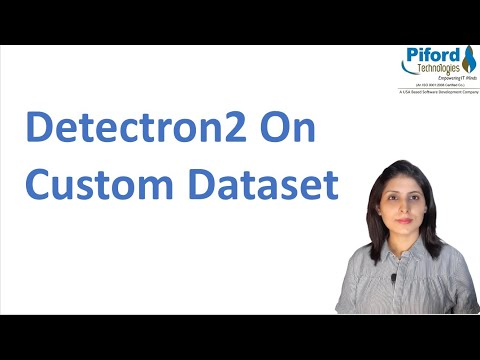

In [ ]:
YouTubeVideo('cQUs4mRpmW4', width=600, height=300)

###  **Choose dataset from  [Coco dataset library](https://cocodataset.org/#explore)**

## Visualizing a pretrained model with trained image.

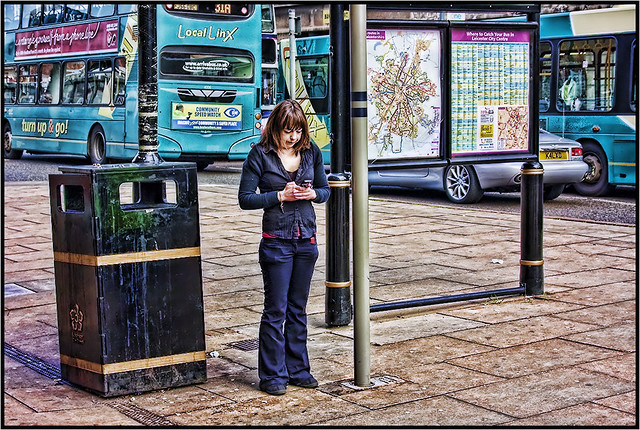

In [ ]:
# code to get the image as input.jpg
!wget http://farm3.staticflickr.com/2467/3698194283_0297565ac7_z.jpg -q -O input.jpg

# reading the image using opencv at location "./input.jpg"
im = cv2.imread("./input.jpg")

# passing im in cv2_imshow and then run the cell
cv2_imshow(im)

## Getting models from [model_zoo](https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md) (Official detectron2 github repository)

Check [here](  https://detectron2.readthedocs.io/en/latest/modules/model_zoo.html) for understanding model zoo api's and how they work from here

In [ ]:
# instantiating get_cfg and storing it in cfg
cfg = get_cfg()

# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
# call merge_from_file in cfg and pass model_zoo.get_config_file with "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml" as argument
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))

# set threshold for this model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  

# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
# call get_checkpoint_url from model_zoo and pass "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml" as argument
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

# instantiate DefaultPredictor you imported earlier and pass cfg as argument and store it in predictor variable
predictor = DefaultPredictor(cfg)

# pass im in predictor as an argument and store the output in outputs
outputs = predictor(im)

model_final_f10217.pkl: 178MB [00:03, 47.6MB/s]                           
/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


 See https://detectron2.readthedocs.io/tutorials/models.html#model-output-format for specification given below

In [ ]:
# look at the outputs using outputs["instances"].pred_classes
print(outputs["instances"].pred_classes)

# print outputs['instances'].pred_boxes
print(outputs["instances"].pred_boxes)

tensor([ 0,  5,  2,  5,  5,  2, 67], device='cuda:0')
Boxes(tensor([[234.4089,  99.5909, 330.4183, 396.4855],
        [  3.4708,   9.3981, 267.7827, 166.0497],
        [370.1284, 136.0372, 588.3267, 200.0725],
        [537.8168,   7.8367, 635.3713, 196.3479],
        [152.2641,   5.4864, 265.0802, 166.9825],
        [538.9003, 125.1345, 590.4923, 200.2993],
        [299.0121, 180.1550, 311.7525, 186.8238]], device='cuda:0'))


## Checking the predictions and detecting features in pretrained image

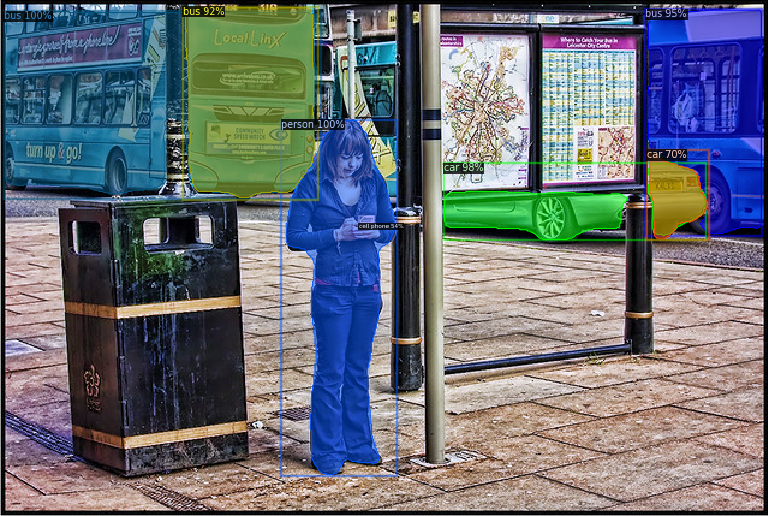

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
# call Visualizer and pass im[:,:,::-1] as first argument, MetadataCatalog.get(cfg.DATASETS.TRAIN[0]) as second argument, scale=1.2 as third argument
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)

# call draw_instance_predictions method on v and pass outputs['instances'].to('cpu') as an argument
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

# call cv2_imshow and pass out.get_image()[:,:,::-1] as an argument
cv2_imshow(out.get_image()[:, :, ::-1])

# **Assignment Part 2 (Detection from custom dataset)**

* Installing coco dataset through PythonAPI
* Installing required libraries
* Installing other libraries for vizualisation
* Setting file paths for annotation
* Finding classes/categories for our datasets
* Displaying images with binding boxes created
* Making Predictions



# **Training Detectron2 on Custom dataset**
You can use any dataset that is present in annotated form or use different open source or paid services like [Roboflow](https://roboflow.com/annotate) to annotate your image data.

## Installing coco dataset dependencies through PythonAPI

In [ ]:
# installing pycoco tools library, just run this cell
!pip install 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-hf0s7vma
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-hf0s7vma
  Created wheel for pycocotools: filename=pycocotools-2.0-cp37-cp37m-linux_x86_64.whl size=263961 sha256=1918abf3e056f34ecfb5c566782a836d2012f5455fe28a1de81194c427250166
  Stored in directory: /tmp/pip-ephem-wheel-cache-kifofgo9/wheels/e2/6b/1d/344ac773c7495ea0b85eb228bc66daec7400a143a92d36b7b1
Successfully built pycocotools
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0.4
    Uninstalling pycocotools-2.0.4:
      Successfully uninstalled pycocotools-2.0.4


## Installing required libraries

In [ ]:
%matplotlib inline

# import COCO from pycocotools.coco
from pycocotools.coco import COCO

# import numpy as np
import numpy as np

# import io from skimage.io
import skimage.io as io

# import pyplot from matplotlib as plt
import matplotlib.pyplot as plt

# import pylab, random
import pylab
import random

# set rcParams['figure.figsize'] in pylab to (8.0, 10.0)
pylab.rcParams['figure.figsize'] = (8.0, 10.0)# Import Libraries


## Installing other libraries for vizualisation

In [ ]:
# import os, seaborn
import os
import seaborn as sns

# import colors from matplotlib
from matplotlib import colors

# import event_accumulator as ea from tensorboard.backend.event_processing
from tensorboard.backend.event_processing import event_accumulator as ea
from PIL import Image

# Download custom dataset from here ---- https://www.kaggle.com/lplenka/detectron2-car-damaged-parts-detection/data

# load the zipped file and use its location in the next code

## **format of code**

### !unzip 'zip file location' -d 'location for unzip data, parallel to the current zip data'

**Unzip the dataset once and then comment out this line to avoid re-unzipping of dataset.**

In [ ]:
# sample code
# !unzip '/content/car_damage_detectron2.zip' -d '/content/car_damage_detectron2_unzipped'   

Archive:  /content/car_damage_detectron2.zip
  inflating: /content/car_damage_detectron2_unzipped/unzipped_cardata/test/67.jpg  
  inflating: /content/car_damage_detectron2_unzipped/unzipped_cardata/train/COCO_mul_train_annos.json  
  inflating: /content/car_damage_detectron2_unzipped/unzipped_cardata/train/17.jpg  
  inflating: /content/car_damage_detectron2_unzipped/unzipped_cardata/test/66.jpg  
  inflating: /content/car_damage_detectron2_unzipped/unzipped_cardata/train/75.jpg  
  inflating: /content/car_damage_detectron2_unzipped/unzipped_cardata/train/77.jpg  
  inflating: /content/car_damage_detectron2_unzipped/unzipped_cardata/train/29.jpg  
  inflating: /content/car_damage_detectron2_unzipped/unzipped_cardata/test/11.jpg  
  inflating: /content/car_damage_detectron2_unzipped/unzipped_cardata/train/47.jpg  
  inflating: /content/car_damage_detectron2_unzipped/unzipped_cardata/train/71.jpg  
  inflating: /content/car_damage_detectron2_unzipped/unzipped_cardata/train/19.jpg  
  in

## Setting file paths for annotation

In [ ]:
# data dir path for val folder
dataDir='/content/car_damage_detectron2_unzipped/unzipped_cardata/val'
dataType='COCO_val_annos'
mul_dataType='COCO_mul_val_annos'

# converting to json
annFile='{}/{}.json'.format(dataDir,dataType)
mul_annFile='{}/{}.json'.format(dataDir,mul_dataType)

# save image dir path in img_dir variable
img_dir = "/content/car_damage_detectron2_unzipped/unzipped_cardata/img"

In [ ]:
# initialize coco api for instance annotations

coco=COCO(annFile)

# do the same for mul_annFile
mul_coco=COCO(mul_annFile)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


## Finding classes/categories for our datasets

In [ ]:
# display categories and supercategories

#Single Class #Damage dataset
cats = coco.loadCats(coco.getCatIds())
nms=[cat['name'] for cat in cats]
print('COCO categories for damages: \n{}\n'.format(', '.join(nms)))

nms = set([cat['supercategory'] for cat in cats])
print('COCO supercategories for damages: \n{}\n'.format(', '.join(nms)))


#Do the same as above for Multi Class #Parts dataset

mul_cats = mul_coco.loadCats(mul_coco.getCatIds())
mul_nms=[cat['name'] for cat in mul_cats]
print('COCO categories for parts: \n{}\n'.format(', '.join(mul_nms)))

mul_nms = set([mul_cat['supercategory'] for mul_cat in mul_cats])
print('COCO supercategories for parts: \n{}\n'.format(', '.join(mul_nms)))

COCO categories for damages: 
damage

COCO supercategories for damages: 
part

COCO categories for parts: 
headlamp, rear_bumper, door, hood, front_bumper

COCO supercategories for parts: 
part



In [ ]:
# get get all ids containing 'damage' category, select one at random using coco.getCatIds and pass catNms=['damage']
catIds = coco.getCatIds(catNms=['damage'])

# get all images containing 'damage' category, using coco.getImgIds and pass catIds=catIds as argument
imgIds = coco.getImgIds(catIds=catIds )

In [ ]:
# choose random image from imgIds using random.choice
random_img_id = random.choice(imgIds)
print("{} image id was selected at random from the {} list".format(random_img_id, imgIds))

6 image id was selected at random from the [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10] list


In [ ]:
# get image id using coco.getImgIds and pass imgIds = [random_img_id] as argument
imgId = coco.getImgIds(imgIds = [random_img_id])

# Load the first image using coco.loadImgs and pass imgId as argument
img = coco.loadImgs(imgId)[0]

# print the image
print("Image details \n",img)

Image details 
 {'coco_url': '', 'date_captured': '2020-07-14 09:59:34.190485', 'file_name': '62.jpg', 'flickr_url': '', 'height': 1024, 'id': 6, 'license': 1, 'width': 1024}


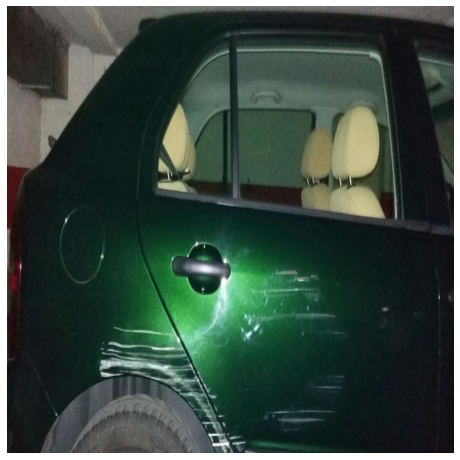

In [ ]:
# read the image using io.imread and pass img_dir + '/' + img['file_name']
I = io.imread(img_dir + '/' + img['file_name'])
plt.axis('off')

# use plt.imshow to plot image I
plt.imshow(I)
plt.show()

In [ ]:
#get damage annotations id using coco.getAnnIds and pass imgIds=imgId
annIds = coco.getAnnIds(imgIds=imgId,iscrowd=None)

# load anns using coco.loadAnns and pass annIds as argument
anns = coco.loadAnns(annIds)

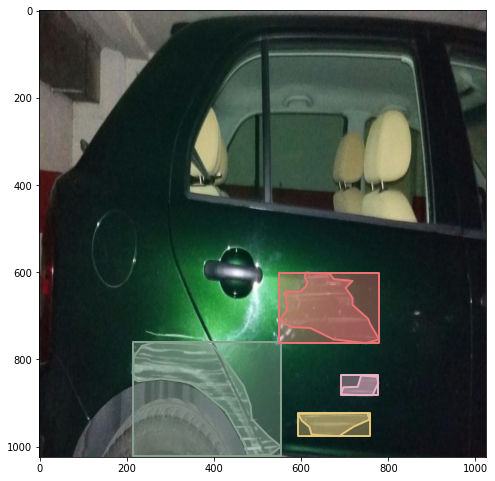

In [ ]:
#Plot damages using plt.imshow and pass I
plt.imshow(I)
plt.axis('on')

# call coco.showAnns and pass anns as first argument, draw_bbox=True as 2nd argument
coco.showAnns(anns, draw_bbox=True )

In [ ]:

#get parts annotations using mul_coco.getAnnIds and pass imgIds=imgId as first argument
mul_annIds = mul_coco.getAnnIds(imgIds=imgId,iscrowd=None)

# call mul_coco.loadAnns and pass mul_annIds as its argument
mul_anns = mul_coco.loadAnns(mul_annIds)

## Create a dictionary between category_id and category name

In [ ]:
# Create a dictionary between category_id and category name
category_map = dict()

# loop over mul_coco.cats.values and update category_map with ele['id']:ele['name']
for ele in list(mul_coco.cats.values()):
    category_map.update({ele['id']:ele['name']})


In [ ]:
# print category_map
category_map

{1: 'headlamp', 2: 'rear_bumper', 3: 'door', 4: 'hood', 5: 'front_bumper'}

In [ ]:
#Create a list of parts in the image
parts = []

# loop over mul_anns  and append it's ['category_id'] in parts
for region in mul_anns:
    parts.append(category_map[region['category_id']])

# print parts list
print("Parts are:", parts) 

Parts are: ['headlamp', 'door']


## Displaying images with binding boxes created





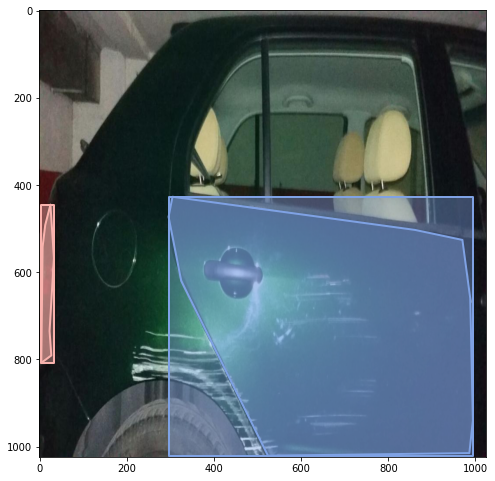

In [ ]:
#read image using io.imread and pass img_dir + '/' + img['file_name']
I = io.imread(img_dir + '/' + img['file_name'])

# plot using plt.imshow
plt.imshow(I)
plt.axis('on')

# call mul_coco.showAnns and pass mul_anns as 1st argument, draw_bbox=True as 2nd argument
mul_coco.showAnns(mul_anns, draw_bbox=True )

## Importing detectron2 utility packages

In [ ]:
# import model_zoo from detectron2
from detectron2 import model_zoo

# import DefaultPredictor from detectron2.engine
from detectron2.engine import DefaultPredictor

# import get_cfg from detectron2.config
from detectron2.config import get_cfg

# import Visualizer from detectron2.utils.visualizer
from detectron2.utils.visualizer import Visualizer

# import MetadataCatalog, DatasetCatalog from detectron2.data
from detectron2.data import MetadataCatalog, DatasetCatalog

# import DefaultTrainer from detectron2.engine
from detectron2.engine import DefaultTrainer

# import ColorMode from detectron2.utils.visualizer
from detectron2.utils.visualizer import ColorMode

# import COCOEvaluator, inference_on_dataset from detectron2.evaluation
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

# import build_detection_test_loader from detectron2.data
from detectron2.data import build_detection_test_loader

In [ ]:
# Set base params using plt.rcParam['figure.figsize'] = [16,9]
plt.rcParams["figure.figsize"] = [16,9]

In [ ]:
# To find out inconsistent CUDA versions, run this code and if "failed" word is not in this output then things are fine.
!python -m detectron2.utils.collect_env

----------------------  ----------------------------------------------------------------
sys.platform            linux
Python                  3.7.12 (default, Sep 10 2021, 00:21:48) [GCC 7.5.0]
numpy                   1.19.5
detectron2              0.6 @/usr/local/lib/python3.7/dist-packages/detectron2
Compiler                GCC 7.3
CUDA compiler           CUDA 11.1
detectron2 arch flags   3.7, 5.0, 5.2, 6.0, 6.1, 7.0, 7.5, 8.0, 8.6
DETECTRON2_ENV_MODULE   <not set>
PyTorch                 1.10.0+cu111 @/usr/local/lib/python3.7/dist-packages/torch
PyTorch debug build     False
GPU available           Yes
GPU 0                   Tesla K80 (arch=3.7)
Driver version          460.32.03
CUDA_HOME               /usr/local/cuda
Pillow                  7.1.2
torchvision             0.11.1+cu111 @/usr/local/lib/python3.7/dist-packages/torchvision
torchvision arch flags  3.5, 5.0, 6.0, 7.0, 7.5, 8.0, 8.6
fvcore                  0.1.5.post20220119
iopath                  0.1.9
cv2              

## Setting dataset path

In [ ]:
# set path of unzipped_cardata
dataset_dir = "/content/car_damage_detectron2_unzipped/unzipped_cardata"

# set path of img dir so that we can use os.path.join(dataset_dr, img_dir)
img_dir = "img/"

# set path of img dir so that we can use os.path.join(dataset_dr, train_dir)
train_dir = "train/"

# set path of img dir so that we can use os.path.join(dataset_dr, val_dir)
val_dir = "val/"

In [ ]:
# import register_coco_instances from detectron2.data.datasets
from detectron2.data.datasets import register_coco_instances

# call register_coco_instances, pass "car_dataset_train" as 1st argument, os.path.join(dataset_dir,train_dir,"COCO_train_annos.json") as 2nd , os.path.join(dataset_dir,img_dir) as 3rd
register_coco_instances("car_dataset_train", {}, os.path.join(dataset_dir,
                                                              train_dir,"COCO_train_annos.json"), os.path.join(dataset_dir,img_dir))

# call register_coco_instances and pass similar arguments for val_dir
register_coco_instances("car_dataset_val", {}, os.path.join(dataset_dir,
                                                            val_dir,"COCO_val_annos.json"), os.path.join(dataset_dir,img_dir))

In [ ]:
# call DatasetCatalog.get and pass "car_dataset_train"
dataset_dicts = DatasetCatalog.get("car_dataset_train")

# call MetadataCatalog.get and pass "car_dataset_train"
metadata_dicts = MetadataCatalog.get("car_dataset_train")

[01/26 05:47:07 d2.data.datasets.coco]: Loaded 59 images in COCO format from /content/car_damage_detectron2_unzipped/unzipped_cardata/train/COCO_train_annos.json


## Displaying image with annotation

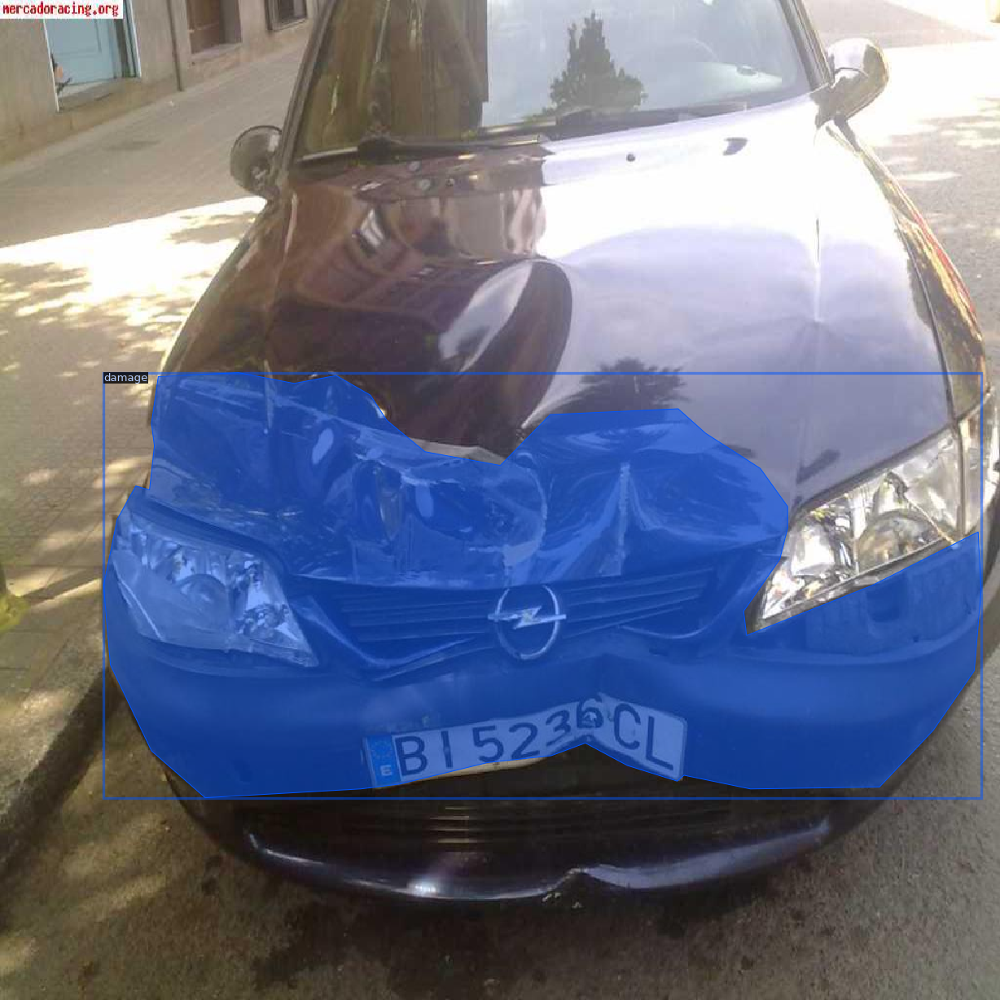

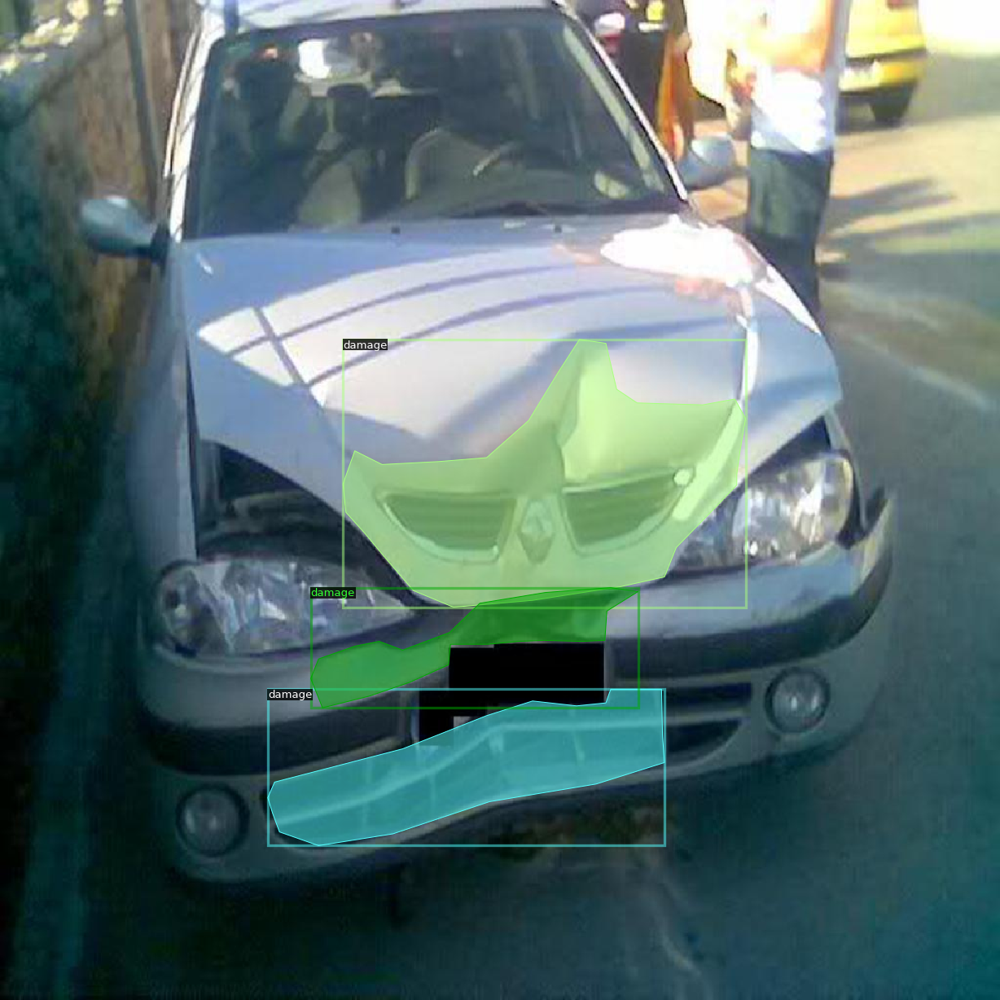

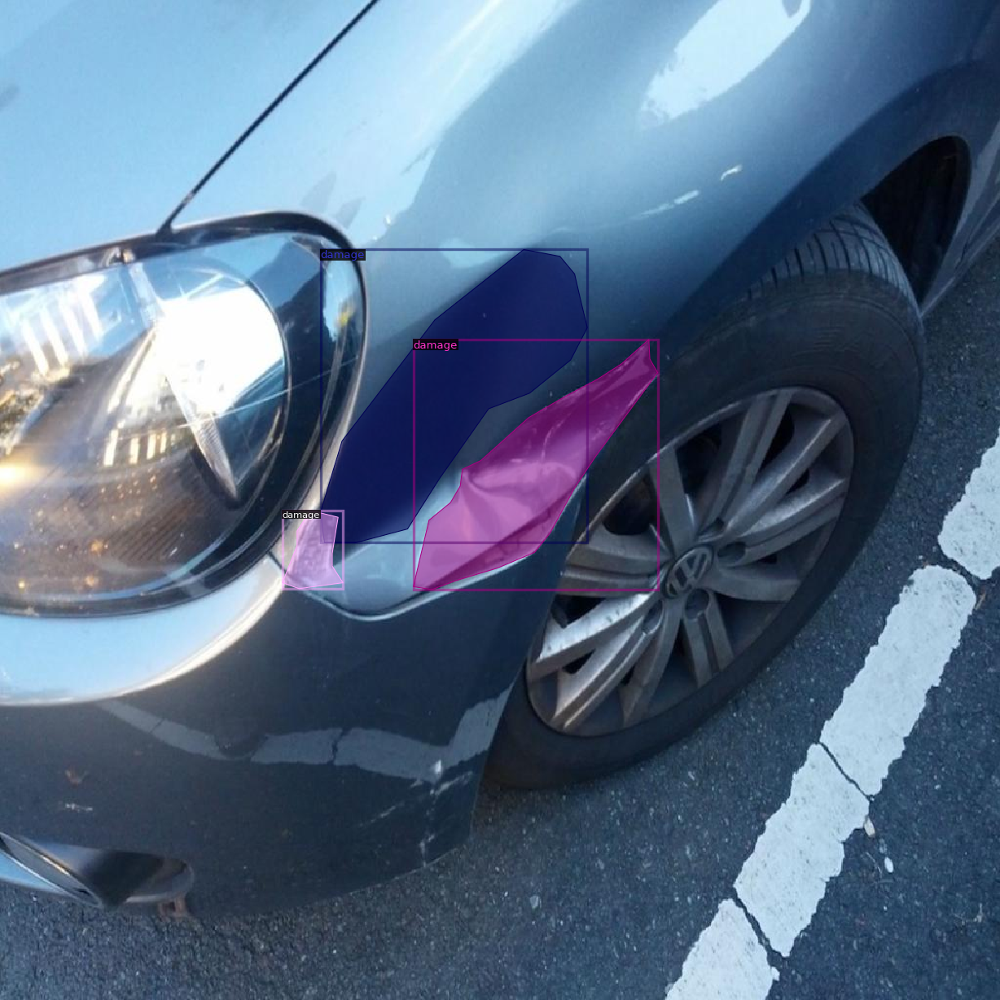

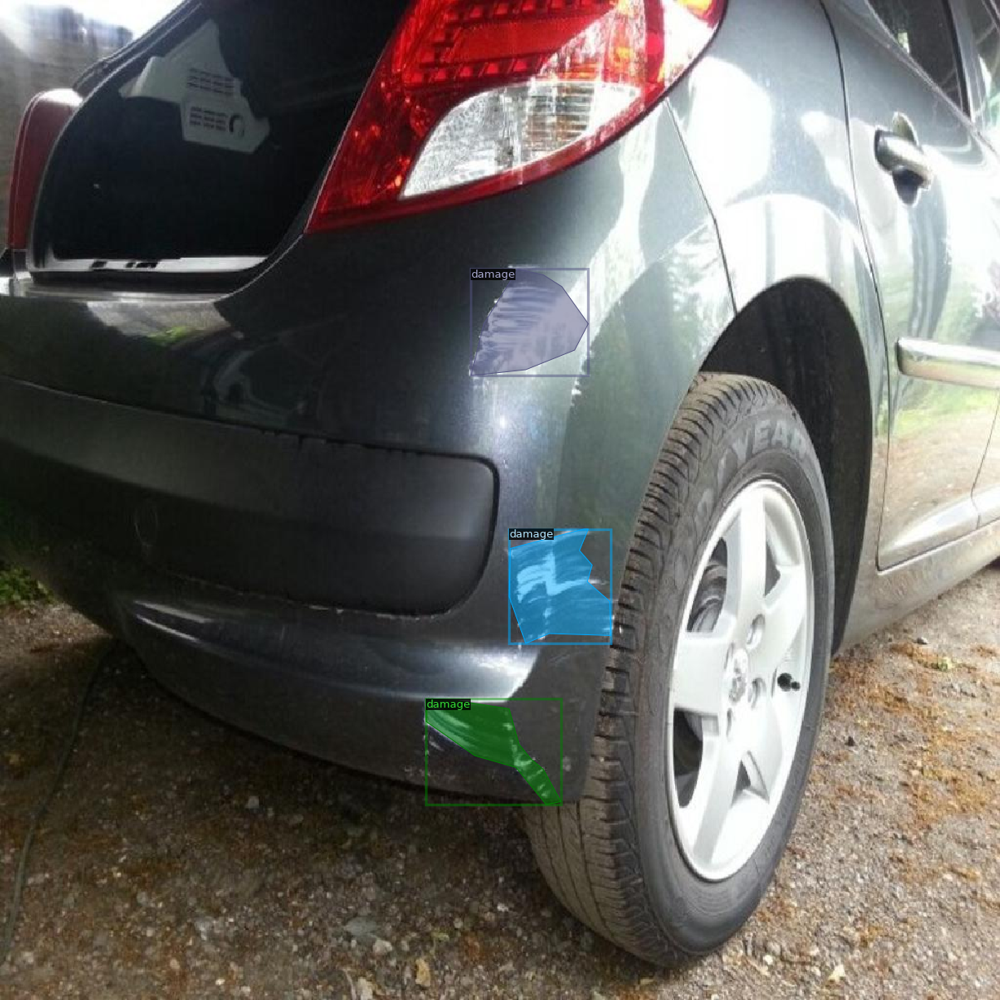

In [ ]:
# loop over random.sample(dataset_dicts,4)
for d in random.sample(dataset_dicts, 4):
    # read the image d['file_name'] using cv2.imread
    img = cv2.imread(d["file_name"])
    # call Visualizer and pass img[:,:,::-1] as 1st argument, metadata=metadata_dicts as 2nd argument, scale=1.2 as 3rd argument
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata_dicts, scale=1.2)
    # call visualizer.draw_dataset_dict and pass d as argument
    vis = visualizer.draw_dataset_dict(d)
    # call imshow and pass vis.get_image()[:,:,::-1]
    cv2_imshow(vis.get_image()[:, :, ::-1])

(see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets) for documentation

## Getting model from model_zoo

In [ ]:
# import DefaultTrainer from detectron2.engine
from detectron2.engine import DefaultTrainer

# instantiate get_cfg()
cfg = get_cfg()

# call cfg.merge_from_file and pass "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))

# set cfg.DATASETS.TRAIN = ("car_dataset_train",)
cfg.DATASETS.TRAIN = ("car_dataset_train",)

# set cfg.DATASETS.TEST = ()
cfg.DATASETS.TEST = ()

# set cfg.DATALOADER.NUM_WORKERS = 2
cfg.DATALOADER.NUM_WORKERS = 2

# call model_zoo.get_checkpoint_url and pass "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo

# set cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.IMS_PER_BATCH = 2

# set cfg.SOLVER.BASE_LR = 0.0025
cfg.SOLVER.BASE_LR = 0.0025  # pick a good LR

# set cfg.SOLVER.MAX_ITER = 2000
cfg.SOLVER.MAX_ITER = 2000  # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset

# set cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)

# set cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6  # (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

# call os.makedirs and pass cfg.OUTPUT_DIR and exist_ok=True as arguments
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# call DefaultTrainer and pass cfg as arguments
trainer = DefaultTrainer(cfg) 

# call trainer.resume_or_load and pass resume=True
trainer.resume_or_load(resume=True)

# call trainer.train()
trainer.train()

[01/26 05:47:41 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:03, 48.6MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (7, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (7,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (24, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (24,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_p

[01/26 05:47:50 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[01/26 05:48:09 d2.utils.events]:  eta: 0:32:19  iter: 19  total_loss: 2.481  loss_cls: 1.73  loss_box_reg: 0.3467  loss_rpn_cls: 0.1918  loss_rpn_loc: 0.01857  time: 0.9556  data_time: 0.0214  lr: 4.9952e-05  max_mem: 1997M
[01/26 05:48:28 d2.utils.events]:  eta: 0:31:44  iter: 39  total_loss: 1.708  loss_cls: 0.9121  loss_box_reg: 0.4736  loss_rpn_cls: 0.09629  loss_rpn_loc: 0.01774  time: 0.9524  data_time: 0.0100  lr: 9.9902e-05  max_mem: 1997M
[01/26 05:48:46 d2.utils.events]:  eta: 0:31:13  iter: 59  total_loss: 0.9922  loss_cls: 0.4846  loss_box_reg: 0.3928  loss_rpn_cls: 0.08513  loss_rpn_loc: 0.0168  time: 0.9397  data_time: 0.0076  lr: 0.00014985  max_mem: 1997M
[01/26 05:49:05 d2.utils.events]:  eta: 0:30:48  iter: 79  total_loss: 0.9861  loss_cls: 0.4278  loss_box_reg: 0.4904  loss_rpn_cls: 0.08403  loss_rpn_loc: 0.02147  time: 0.9366  data_time: 0.0091  lr: 0.0001998  max_mem: 1997M
[01/26 05:49:24 d2.utils.events]:  eta: 0:30:29  iter: 99  total_loss: 0.8472  loss_cls: 0.

In [ ]:
# call os.path.join and pass cfg.OUTPUT_DIR, "model_final.pth" as arguments
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

# set cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model

# set cfg.DATASETS.TEST = ("car_dataset_train",)
cfg.DATASETS.TEST = ("car_dataset_train",)

# call DefaultPredictor and pass cfg as argument
predictor = DefaultPredictor(cfg)

## Making predictions

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


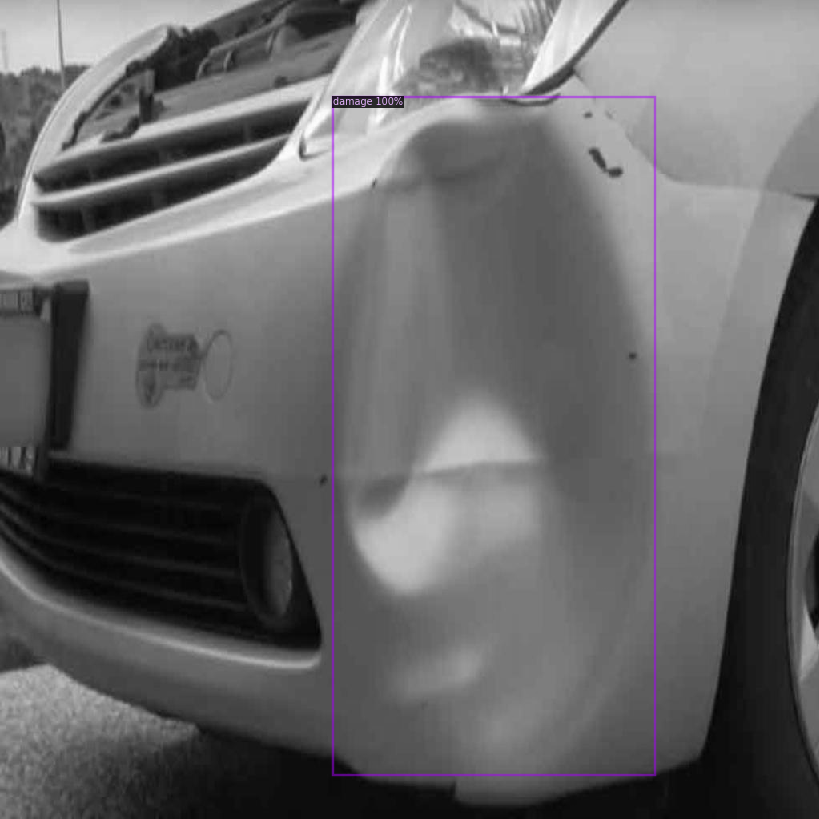

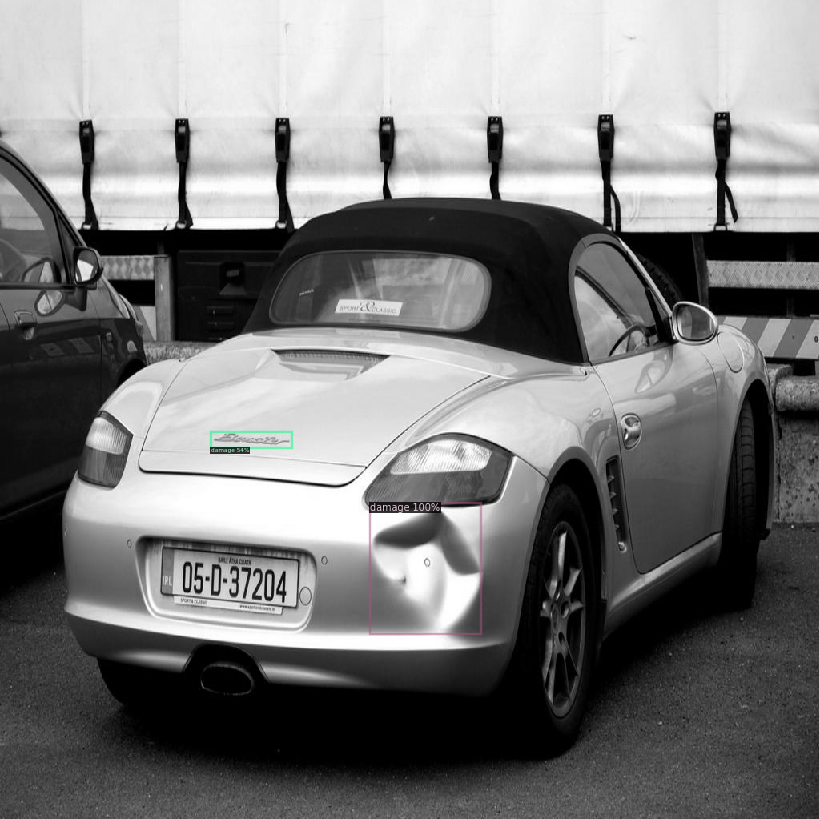

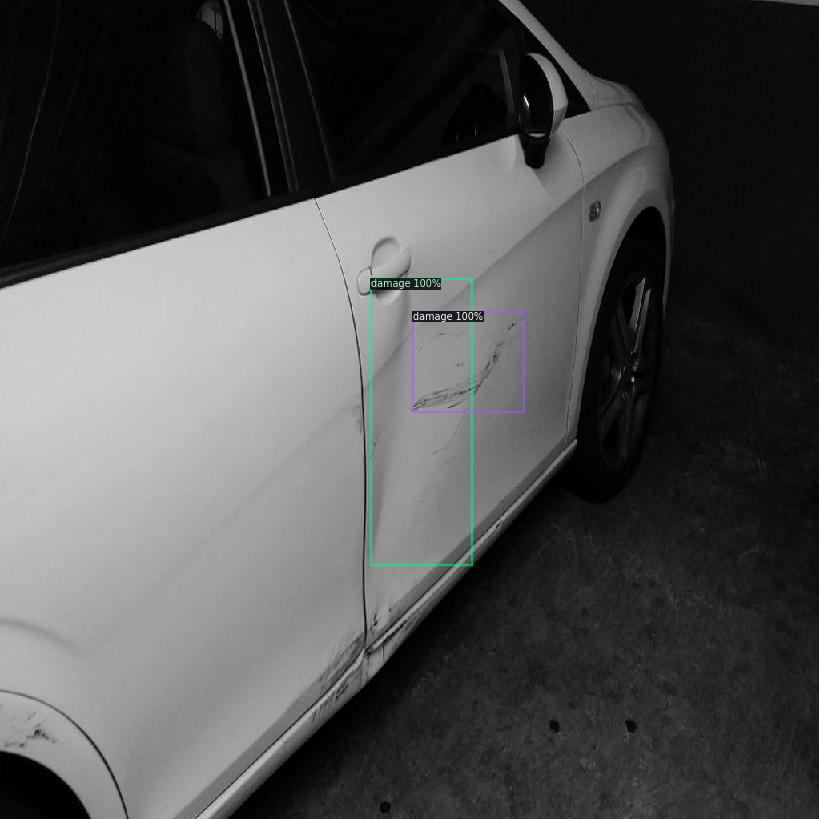

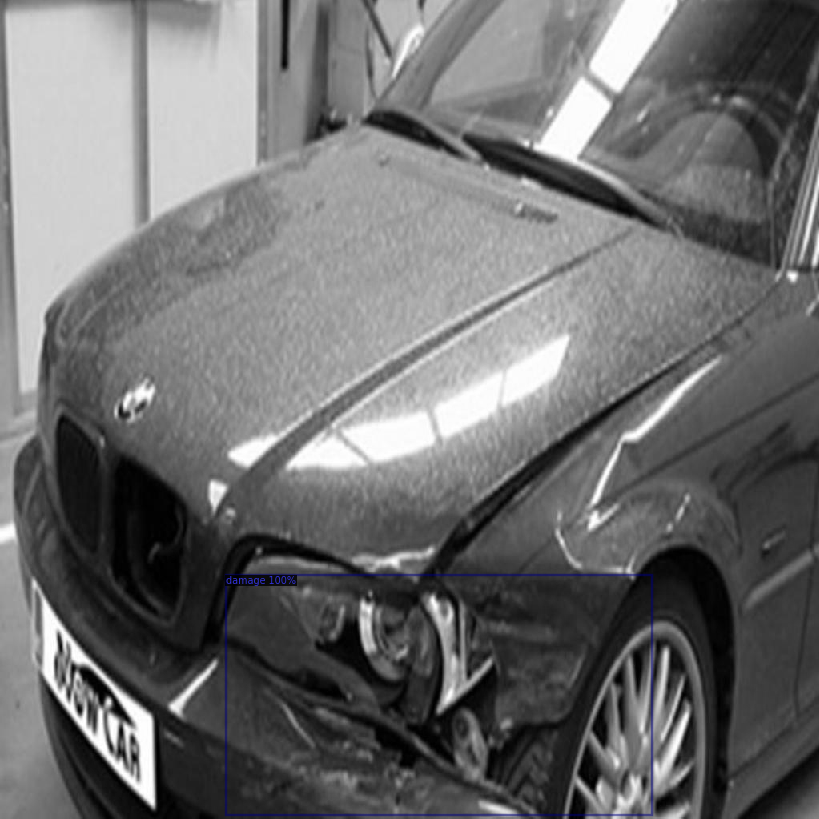

In [ ]:
# loop over random.sample(dataset_dicts, 4)
for d in random.sample(dataset_dicts, 4):
    # call cv2.imread and pass d["file_name"]    
    im = cv2.imread(d["file_name"])
    # call predictor and pass im as argument
    outputs = predictor(im)
    # call Visualizer and pass im[:,:,::-1], metadata=metadata_dicts, scale=0.8, instance_mode=ColorMode.IMAGE_BW as argument
    v = Visualizer(im[:, :, ::-1],
                   metadata=metadata_dicts, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    # call v.draw_instance_predictions and pass outputs["instances"].to("cpu")
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    # call cv2_imshow and pass v.get_image()[:,:,::-1] as argument
    cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
# open file 'config.yml' in writing mode
f = open('config.yml', 'w')

# call f.write and pass cfg.dump() as argument
f.write(cfg.dump())

# call f.close()
f.close()

## Inference on dataset

In [ ]:
# import COCOEvaluator, inference_on_dataset from detectron2.evaluation
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

# import build_detection_test_loader from detectron2.data
from detectron2.data import build_detection_test_loader

# call COCOEvaluator and pass "car_dataset_train", output_dir="./output" as argument
evaluator = COCOEvaluator("car_dataset_train", output_dir="./output")

# call build_detection_test_loader and pass cfg, "car_dataset_train" as argument
val_loader = build_detection_test_loader(cfg, "car_dataset_train")

# call inference_on_dataset, pass predictor.model, val_loader, evaluator as argument
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[01/26 06:23:36 d2.data.datasets.coco]: Loaded 59 images in COCO format from /content/car_damage_detectron2_unzipped/unzipped_cardata/train/COCO_train_annos.json
[01/26 06:23:36 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[01/26 06:23:36 d2.data.common]: Serializing 59 elements to byte tensors and concatenating them all ...
[01/26 06:23:36 d2.data.common]: Serialized dataset takes 0.03 MiB
[01/26 06:23:36 d2.evaluation.evaluator]: Start inference on 59 batches


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[01/26 06:23:40 d2.evaluation.evaluator]: Inference done 11/59. Dataloading: 0.0019 s/iter. Inference: 0.2832 s/iter. Eval: 0.0003 s/iter. Total: 0.2854 s/iter. ETA=0:00:13
[01/26 06:23:45 d2.evaluation.evaluator]: Inference done 29/59. Dataloading: 0.0021 s/iter. Inference: 0.2821 s/iter. Eval: 0.0003 s/iter. Total: 0.2847 s/iter. ETA=0:00:08
[01/26 06:23:50 d2.evaluation.evaluator]: Inference done 47/59. Dataloading: 0.0024 s/iter. Inference: 0.2821 s/iter. Eval: 0.0003 s/iter. Total: 0.2849 s/iter. ETA=0:00:03
[01/26 06:23:53 d2.evaluation.evaluator]: Total inference time: 0:00:15.395807 (0.285108 s / iter per device, on 1 devices)
[01/26 06:23:53 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:15 (0.281412 s / iter per device, on 1 devices)
[01/26 06:23:53 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[01/26 06:23:53 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[01/26 06:23:53 d2.evaluation.coco_eva

For more in depth watch of Detectron2 and its background watch [here](https://youtu.be/geyNLYPAH_Y)


# **FEEDBACK FORM**

https://forms.zohopublic.in/cloudyml/form/CloudyMLDeepLearningFeedbackForm/formperma/VCFbldnXAnbcgAIl0lWv2blgHdSldheO4RfktMdgK7s

 You completed the Detectron2 assignment. Now you are ready to create your own detection project. Please fill the feedback form to help us improve our assignments.